In [1]:
import os
import matplotlib.pyplot as plt
import itertools
import pickle
import imageio
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torchsummary import summary
import pickle
import os, time
import matplotlib.pyplot as plt
import itertools
import pickle
import imageio
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
import cv2
import torch
import torch.nn as nn

# DCGAN

In [2]:
class discriminator(nn.Module):
    # initializers
  def __init__(self, d=128):
    super(discriminator, self).__init__()

    self.conv1 =  nn.Conv2d(3, d, kernel_size=  4,  stride = 2, padding=1, bias= False)
    self.leaky_relu = nn.LeakyReLU(0.2)

    self.conv2 = nn.Conv2d(d, d*2, 4,  2, 1, bias= False)
    #self.inst_norm2 = nn.InstanceNorm2d(d*2, affine = True)

    self.conv3 = nn.Conv2d(d*2, d*4, 4,  2, 1, bias= False)
    #self.inst_norm3 = nn.InstanceNorm2d(d*4, affine = True)

    self.conv4 = nn.Conv2d(d*4, d*8, 4,  2, 1, bias= False)
    #self.inst_norm4 = nn.InstanceNorm2d(d*8, affine = True)

    self.conv5  = nn.Conv2d(d*8, 1 ,4, 2, 0, bias= False)
    self.sigmoid = nn.Sigmoid()



  def forward(self, x):
    x = self.leaky_relu(self.conv1(x))

    x = self.leaky_relu((self.conv2(x)))

    x = self.leaky_relu((self.conv3(x)))

    x = self.leaky_relu((self.conv4(x)))

    x = self.conv5(x)

    return self.sigmoid(x)


class generator(nn.Module):
  def __init__(self, d  = 128):
    super(generator, self).__init__()
    self.convtrans1 =  nn.ConvTranspose2d(100, d*16, 4,  1, 0, bias = False)
    #self.bn1  = nn.BatchNorm2d(d*16)
    self.relu = nn.ReLU()

    self.convtrans2 =  nn.ConvTranspose2d(d*16, d*8, 4,  2, 1, bias = False)
    #self.bn2  = nn.BatchNorm2d(d*8)
    #self.relu = nn.ReLU()

    self.convtrans3 =  nn.ConvTranspose2d(d*8, d*4, 4,  2, 1, bias = False)
    #self.bn3  = nn.BatchNorm2d(d*4)
    #self.relu = nn.ReLU()

    self.convtrans4 =  nn.ConvTranspose2d(d*4, d*2, 4,  2, 1, bias = False)
    #self.bn4  = nn.BatchNorm2d(d*2)
    #self.relu = nn.ReLU()
    
    self.convtrans5 = nn.ConvTranspose2d(d*2, 3, 4, 2, 1, bias = False)
    self.tan = nn.Tanh()


  def forward(self, x):

    x = self.relu((self.convtrans1(x)))
    x = self.relu((self.convtrans2(x)))
    x = self.relu((self.convtrans3(x)))
    x = self.relu((self.convtrans4(x)))

    x = self.tan(self.convtrans5(x))

    return x 


def initialize_weights(model):
    # Initializes weights according to the DCGAN paper
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal

## Dataloaders

In [3]:
!unzip robots.zip

Archive:  robots.zip
replace robots/train/nrbt/no_robot_10.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: robots/train/nrbt/no_robot_10.jpg  
  inflating: robots/train/nrbt/no_robot_15.jpg  
  inflating: robots/train/nrbt/no_robot_19.jpg  
  inflating: robots/train/nrbt/no_robot_22.jpg  
  inflating: robots/train/nrbt/no_robot_23.jpg  
  inflating: robots/train/nrbt/no_robot_24.jpg  
  inflating: robots/train/nrbt/no_robot_25.jpg  
  inflating: robots/train/nrbt/no_robot_27.jpg  
  inflating: robots/train/nrbt/no_robot_28.jpg  
  inflating: robots/train/nrbt/no_robot_3.jpg  
  inflating: robots/train/nrbt/no_robot_31.jpg  
  inflating: robots/train/nrbt/no_robot_32.jpg  
  inflating: robots/train/nrbt/no_robot_33.jpg  
  inflating: robots/train/nrbt/no_robot_35.jpg  
  inflating: robots/train/nrbt/no_robot_36.jpg  
  inflating: robots/train/nrbt/no_robot_37.jpg  
  inflating: robots/train/nrbt/no_robot_39.jpg  
  inflating: robots/train/nrbt/no_robot_4.jpg  
  inflating: rob

In [5]:
# Data augmentation and normalization for training


# training parameters
batch_size = 25
lr = 2e-4
train_epoch = 100

# data_loader

data_transforms = {
    'train': transforms.Compose([
        #transforms.RandomResizedCrop(224),
        #transforms.RandomHorizontalFlip(),
        transforms.Resize((64,64)),
        transforms.ToTensor(),
        #transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
    'val': transforms.Compose([
        #transforms.Resize(256),
        #transforms.CenterCrop(224),
        transforms.Resize((64,64)),
        transforms.ToTensor(),
        #transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
}

data_dir = 'robots'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
train_loaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}

#image_datasets['train'].classes = ['not_robot', 'robot']

class_names = image_datasets['train'].classes

avDev = torch.device("cuda")

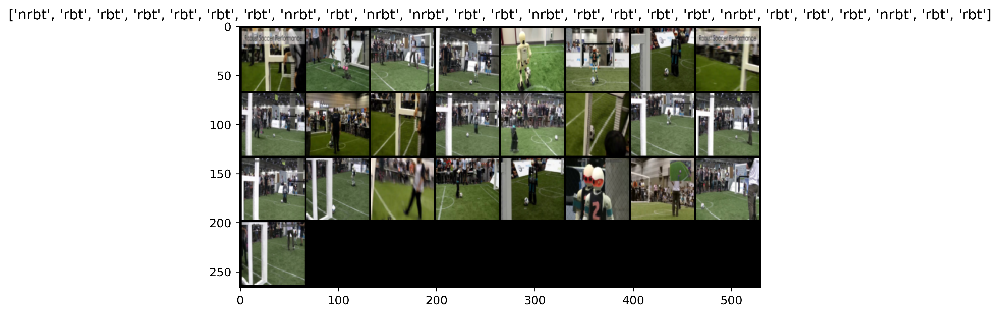

In [6]:
from matplotlib.pyplot import figure
def sampleshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    
    figure(num=None, figsize=(8, 8), dpi=360, facecolor='w', edgecolor='k')
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(train_loaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

sampleshow(out, title=[class_names[x] for x in classes])

In [7]:
def show_train_hist(hist, show = False, save = False, path = 'Train_hist.png'):
    x = range(len(hist['D_losses']))

    y1 = hist['D_losses']
    y2 = hist['G_losses']

    plt.plot(x, y1, label='D_loss')
    plt.plot(x, y2, label='G_loss')

    plt.xlabel('Iter')
    plt.ylabel('Loss')

    plt.legend(loc=4)
    plt.grid(True)
    plt.tight_layout()

    if save:
        plt.savefig(path)

    if show:
        plt.show()
    else:
        plt.close()

In [8]:
import numpy as np
def show_result(num_epoch, show = False, save = False, path = 'result.png', isFix=False):

    z_ = torch.randn((5*5, 100)).view(-1, 100, 1, 1)
    z_ = z_.cuda()

    gen.eval()
    if isFix:
        test_images = gen(fixed_z_)
    else:
        test_images = gen(z_)
    gen.train()
    
    size_figure_grid = 5
    fig, ax = plt.subplots(size_figure_grid, size_figure_grid, figsize=(5, 5))
    for i, j in itertools.product(range(size_figure_grid), range(size_figure_grid)):
        ax[i, j].get_xaxis().set_visible(False)
        ax[i, j].get_yaxis().set_visible(False)

    for k in range(5*5):
        i = k // 5
        j = k % 5
        #print(test_images[k].shape)
        ax[i, j].cla()
        ax[i, j].imshow((np.transpose(test_images[k].cpu().data.numpy(),(1,2,0))*255).astype(np.uint8))

    label = 'Epoch {0}'.format(num_epoch)
    fig.text(0.5, 0.04, label, ha='center')
    plt.savefig(path)

    if show:
        plt.show()
    else:
        plt.close()


In [9]:
# results save folder
if not os.path.isdir('DCGAN_results'):
    os.mkdir('DCGAN_results')
if not os.path.isdir('DCGAN_results/Random_results'):
    os.mkdir('DCGAN_results/Random_results')
if not os.path.isdir('DCGAN_results/Fixed_results'):
    os.mkdir('DCGAN_results/Fixed_results')

## Create Model

In [10]:

# Hyperparameters etc.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

gen = generator(64).to(device)
disc = discriminator(64).to(device)
initialize_weights(gen)
initialize_weights(disc)

opt_gen = optim.Adam(gen.parameters(), lr= lr, betas=(0.5, 0.999))
opt_disc = optim.Adam(disc.parameters(), lr= lr, betas=(0.5, 0.999))
criterion = nn.BCELoss()

fixed_z_ = torch.randn(25, 100, 1, 1).to(device)

step = 0

gen.train()
disc.train()


discriminator(
  (conv1): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (leaky_relu): LeakyReLU(negative_slope=0.2)
  (conv2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (conv3): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (conv4): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (conv5): Conv2d(512, 1, kernel_size=(4, 4), stride=(2, 2), bias=False)
  (sigmoid): Sigmoid()
)

In [11]:
print(summary(gen, input_size = (100,1,1)) )

print(summary(disc, input_size = (3,64,64)) )

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1           [-1, 1024, 4, 4]       1,638,400
              ReLU-2           [-1, 1024, 4, 4]               0
   ConvTranspose2d-3            [-1, 512, 8, 8]       8,388,608
              ReLU-4            [-1, 512, 8, 8]               0
   ConvTranspose2d-5          [-1, 256, 16, 16]       2,097,152
              ReLU-6          [-1, 256, 16, 16]               0
   ConvTranspose2d-7          [-1, 128, 32, 32]         524,288
              ReLU-8          [-1, 128, 32, 32]               0
   ConvTranspose2d-9            [-1, 3, 64, 64]           6,144
             Tanh-10            [-1, 3, 64, 64]               0
Total params: 12,654,592
Trainable params: 12,654,592
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 3.94
Params size (MB): 48.27
Esti

## Training

training start!
[1/100] - ptime: 1.27, loss_d: 0.651, loss_g: 0.619


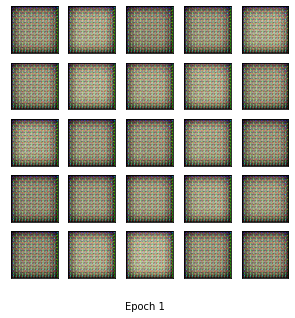

[2/100] - ptime: 1.28, loss_d: 0.640, loss_g: 0.941


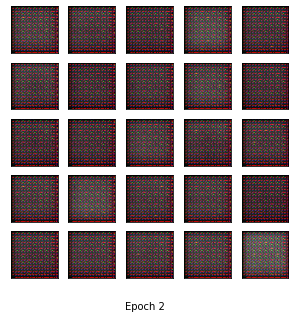

[3/100] - ptime: 1.24, loss_d: 0.599, loss_g: 0.657


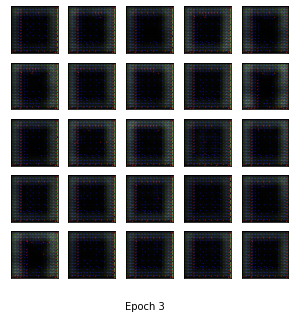

[4/100] - ptime: 1.29, loss_d: 0.631, loss_g: 0.653


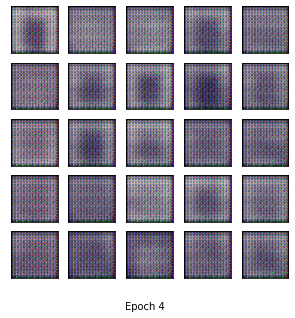

[5/100] - ptime: 1.34, loss_d: 0.625, loss_g: 0.945


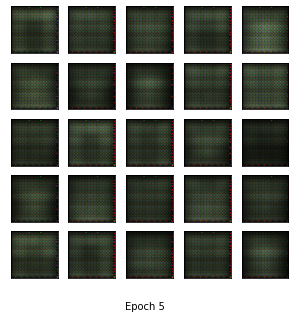

[6/100] - ptime: 1.32, loss_d: 0.659, loss_g: 0.710


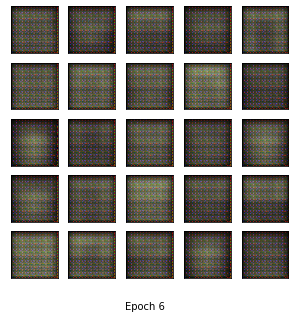

[7/100] - ptime: 1.28, loss_d: 0.524, loss_g: 0.712


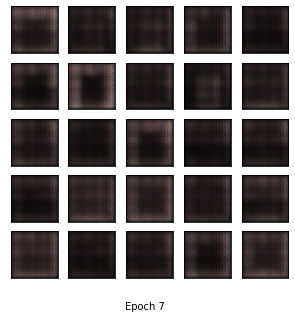

[8/100] - ptime: 1.66, loss_d: 0.586, loss_g: 0.763


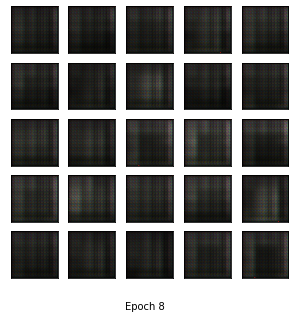

[9/100] - ptime: 1.30, loss_d: 0.553, loss_g: 0.641


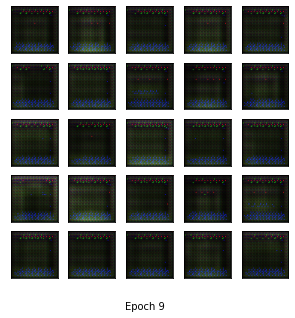

[10/100] - ptime: 1.24, loss_d: 0.634, loss_g: 0.693


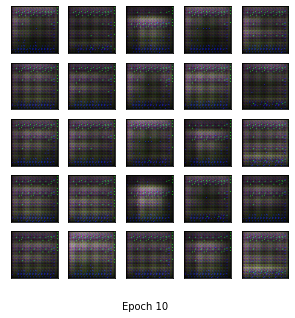

[11/100] - ptime: 1.26, loss_d: 0.598, loss_g: 0.770


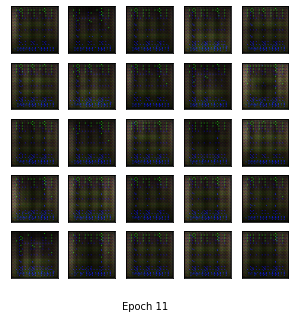

[12/100] - ptime: 1.25, loss_d: 0.611, loss_g: 0.663


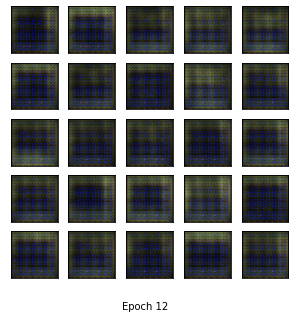

[13/100] - ptime: 1.28, loss_d: 0.622, loss_g: 0.726


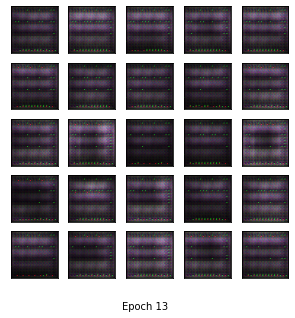

[14/100] - ptime: 1.30, loss_d: 0.617, loss_g: 0.780


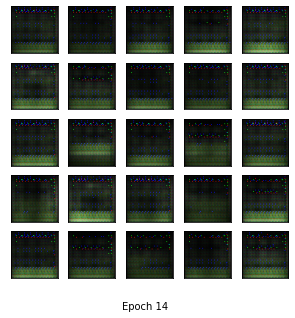

[15/100] - ptime: 1.28, loss_d: 0.599, loss_g: 0.685


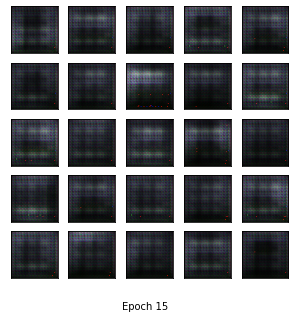

[16/100] - ptime: 1.22, loss_d: 0.656, loss_g: 0.645


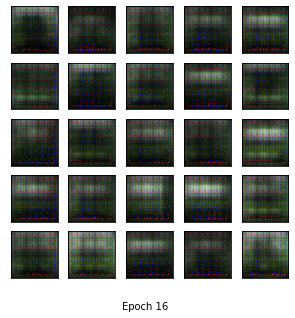

[17/100] - ptime: 1.72, loss_d: 0.617, loss_g: 0.708


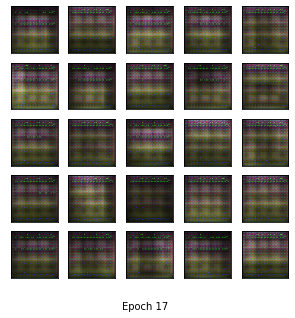

[18/100] - ptime: 1.25, loss_d: 0.652, loss_g: 0.737


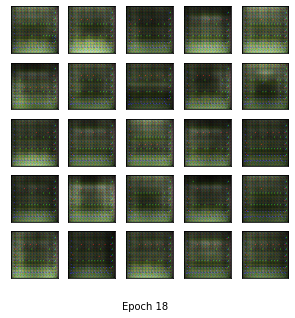

[19/100] - ptime: 1.31, loss_d: 0.652, loss_g: 0.696


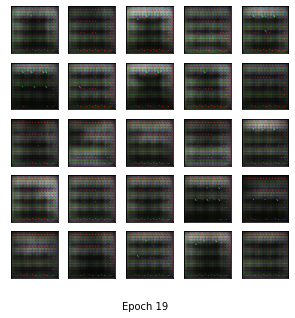

[20/100] - ptime: 1.23, loss_d: 0.611, loss_g: 0.754


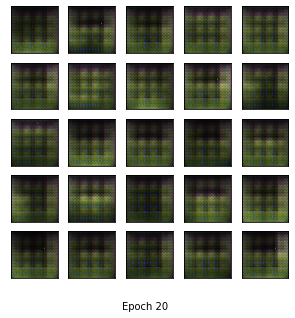

[21/100] - ptime: 1.28, loss_d: 0.631, loss_g: 0.738


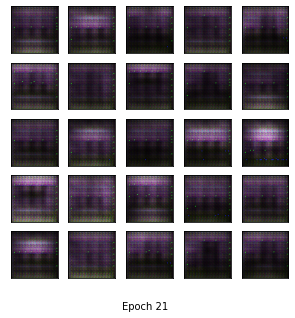

[22/100] - ptime: 1.23, loss_d: 0.602, loss_g: 0.802


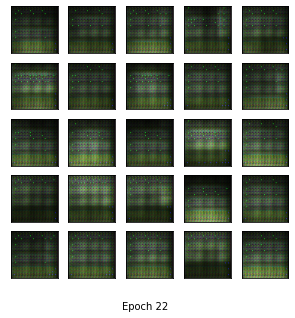

[23/100] - ptime: 1.25, loss_d: 0.673, loss_g: 0.718


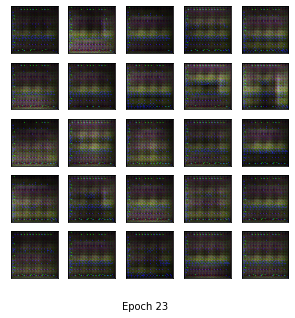

[24/100] - ptime: 1.30, loss_d: 0.589, loss_g: 0.659


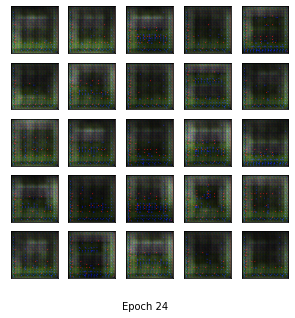

[25/100] - ptime: 1.23, loss_d: 0.651, loss_g: 0.629


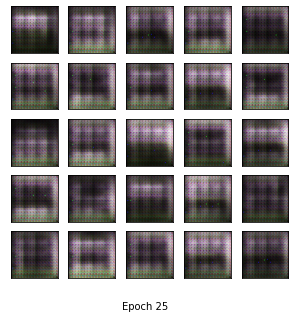

[26/100] - ptime: 1.69, loss_d: 0.666, loss_g: 0.803


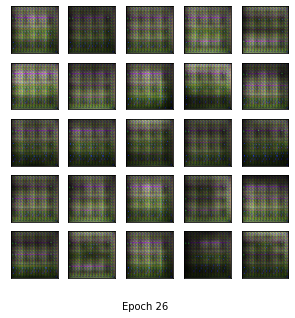

[27/100] - ptime: 1.27, loss_d: 0.694, loss_g: 0.639


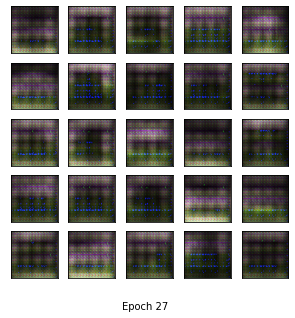

[28/100] - ptime: 1.37, loss_d: 0.711, loss_g: 0.652


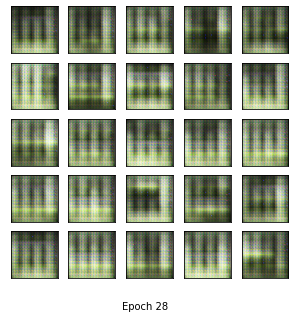

[29/100] - ptime: 1.20, loss_d: 0.637, loss_g: 0.805


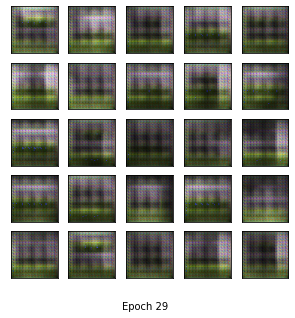

[30/100] - ptime: 1.23, loss_d: 0.700, loss_g: 0.743


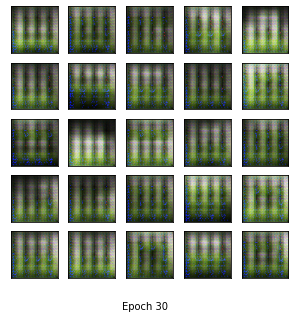

[31/100] - ptime: 1.33, loss_d: 0.672, loss_g: 0.733


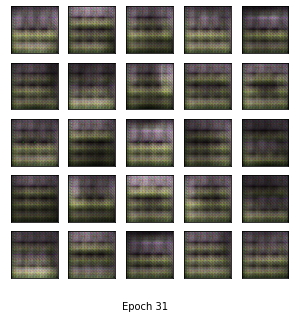

[32/100] - ptime: 1.22, loss_d: 0.685, loss_g: 0.663


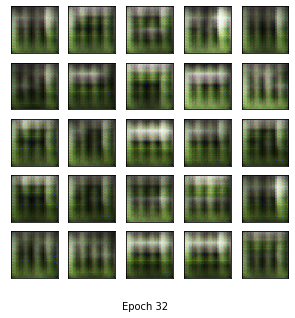

[33/100] - ptime: 1.25, loss_d: 0.646, loss_g: 0.803


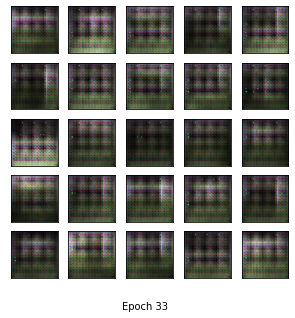

[34/100] - ptime: 1.28, loss_d: 0.682, loss_g: 0.763


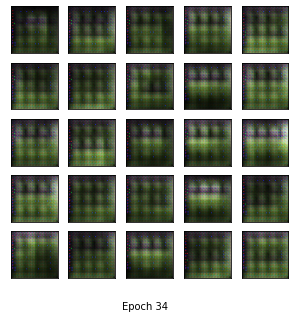

[35/100] - ptime: 1.72, loss_d: 0.663, loss_g: 0.745


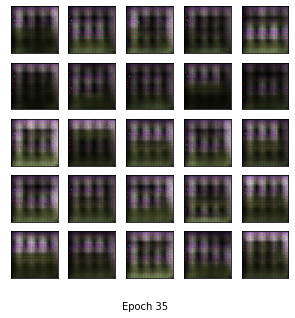

[36/100] - ptime: 1.30, loss_d: 0.688, loss_g: 0.655


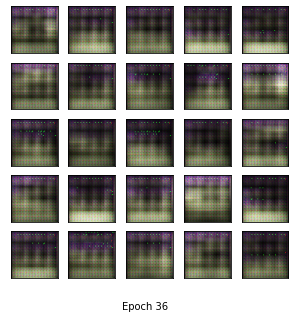

[37/100] - ptime: 1.25, loss_d: 0.653, loss_g: 0.844


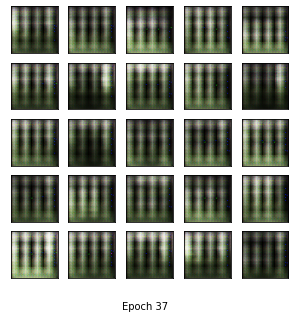

[38/100] - ptime: 1.25, loss_d: 0.678, loss_g: 0.768


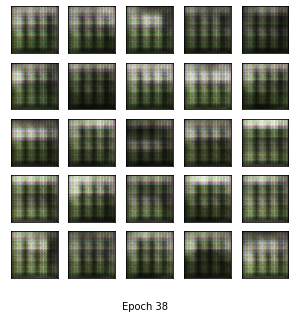

[39/100] - ptime: 1.27, loss_d: 0.713, loss_g: 0.799


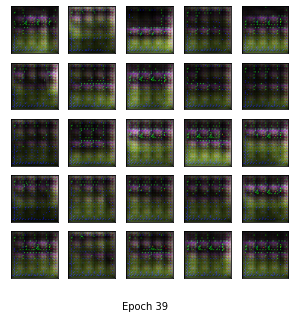

[40/100] - ptime: 1.25, loss_d: 0.564, loss_g: 0.764


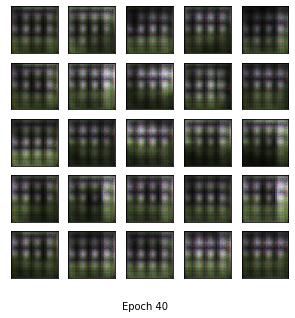

[41/100] - ptime: 1.26, loss_d: 0.727, loss_g: 0.733


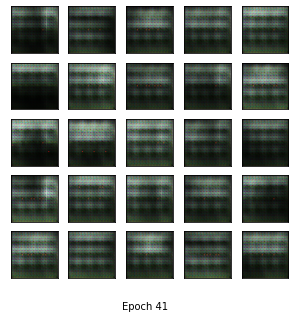

[42/100] - ptime: 1.32, loss_d: 0.666, loss_g: 0.730


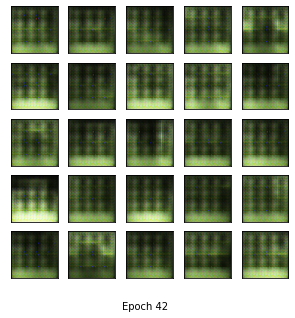

[43/100] - ptime: 1.27, loss_d: 0.610, loss_g: 0.693


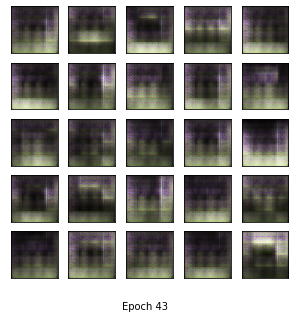

[44/100] - ptime: 1.69, loss_d: 0.680, loss_g: 0.793


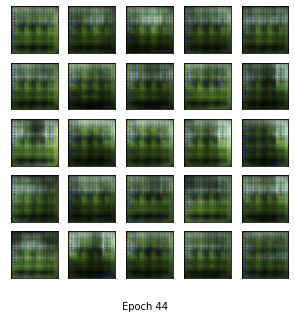

[45/100] - ptime: 1.29, loss_d: 0.603, loss_g: 0.763


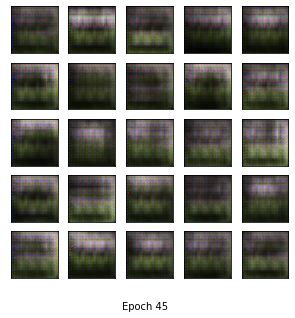

[46/100] - ptime: 1.35, loss_d: 0.620, loss_g: 0.795


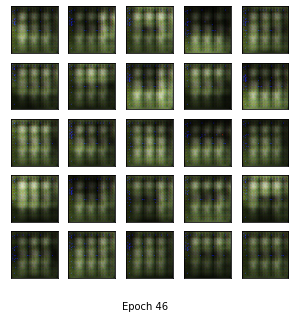

[47/100] - ptime: 1.29, loss_d: 0.573, loss_g: 0.774


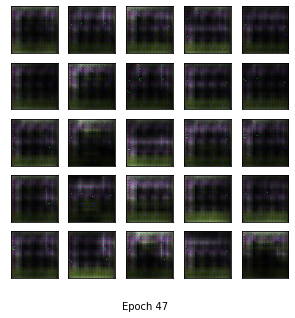

[48/100] - ptime: 1.23, loss_d: 0.676, loss_g: 0.755


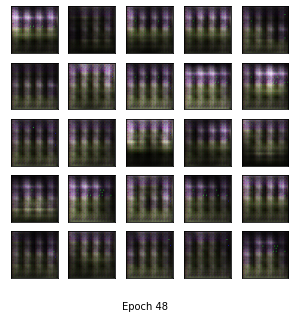

[49/100] - ptime: 1.24, loss_d: 0.685, loss_g: 0.792


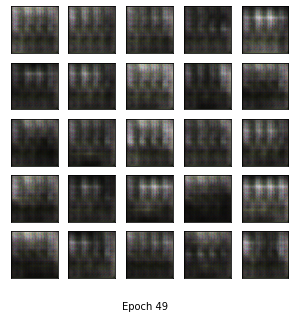

[50/100] - ptime: 1.20, loss_d: 0.667, loss_g: 0.635


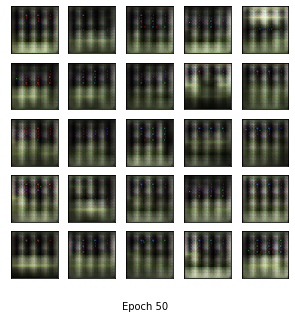

[51/100] - ptime: 1.29, loss_d: 0.594, loss_g: 0.730


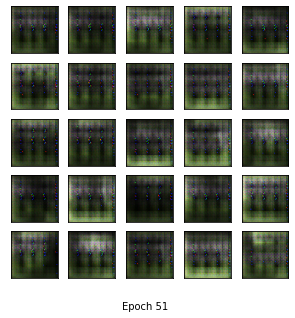

[52/100] - ptime: 1.28, loss_d: 0.672, loss_g: 0.735


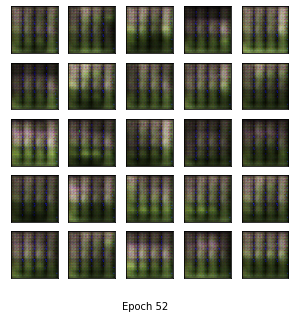

[53/100] - ptime: 1.74, loss_d: 0.662, loss_g: 0.715


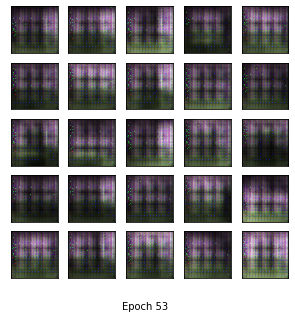

[54/100] - ptime: 1.28, loss_d: 0.640, loss_g: 0.732


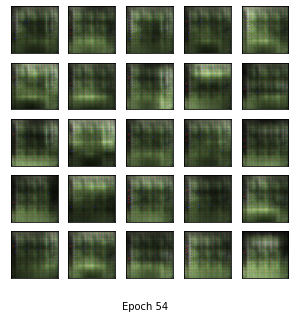

[55/100] - ptime: 1.22, loss_d: 0.570, loss_g: 0.712


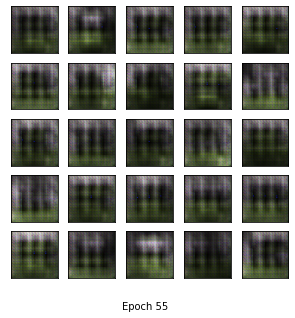

[56/100] - ptime: 1.24, loss_d: 0.677, loss_g: 0.811


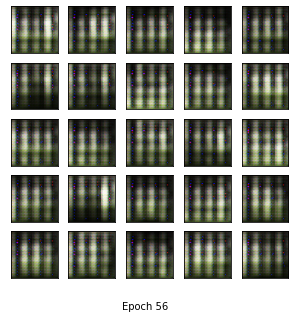

[57/100] - ptime: 1.30, loss_d: 0.530, loss_g: 0.873


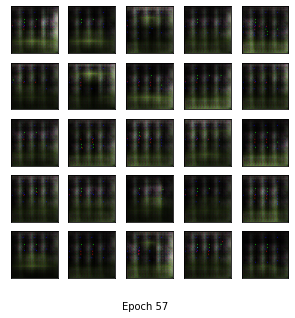

[58/100] - ptime: 1.30, loss_d: 0.640, loss_g: 0.647


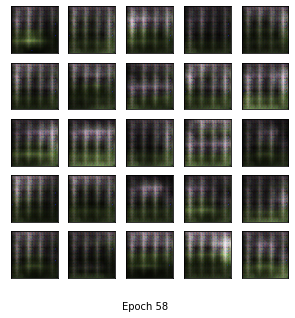

[59/100] - ptime: 1.25, loss_d: 0.654, loss_g: 0.755


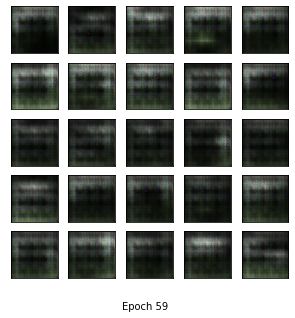

[60/100] - ptime: 1.26, loss_d: 0.624, loss_g: 0.642


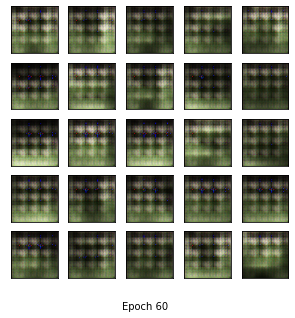

[61/100] - ptime: 1.24, loss_d: 0.557, loss_g: 0.826


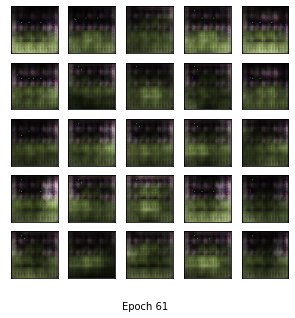

[62/100] - ptime: 1.64, loss_d: 0.597, loss_g: 0.679


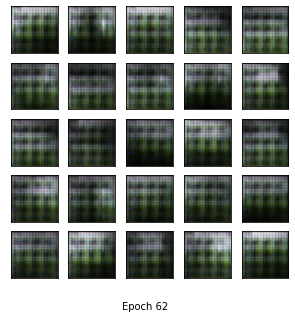

[63/100] - ptime: 1.23, loss_d: 0.600, loss_g: 0.846


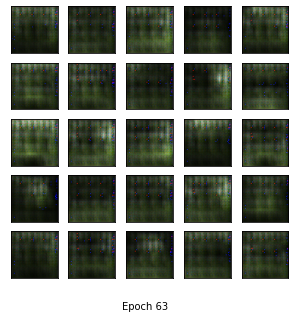

[64/100] - ptime: 1.27, loss_d: 0.671, loss_g: 0.678


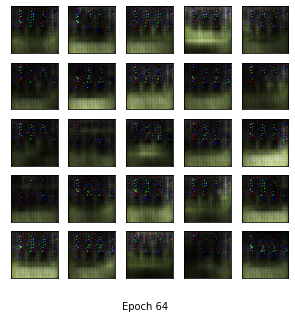

[65/100] - ptime: 1.21, loss_d: 0.573, loss_g: 0.707


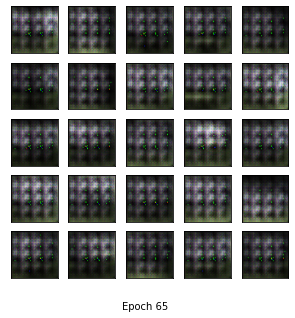

[66/100] - ptime: 1.29, loss_d: 0.653, loss_g: 0.725


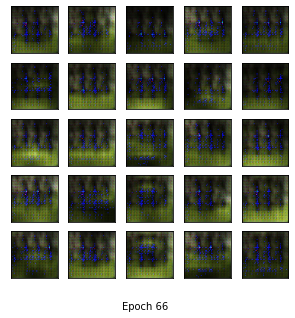

[67/100] - ptime: 1.18, loss_d: 0.623, loss_g: 0.776


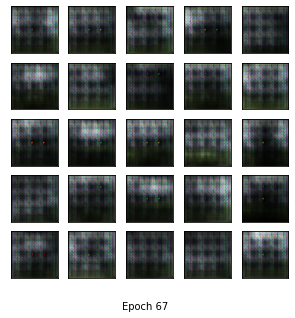

[68/100] - ptime: 1.30, loss_d: 0.653, loss_g: 0.810


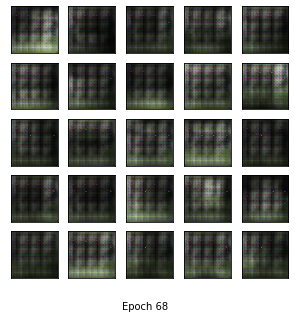

[69/100] - ptime: 1.23, loss_d: 0.631, loss_g: 0.666


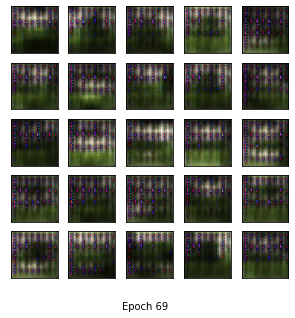

[70/100] - ptime: 1.28, loss_d: 0.634, loss_g: 0.788


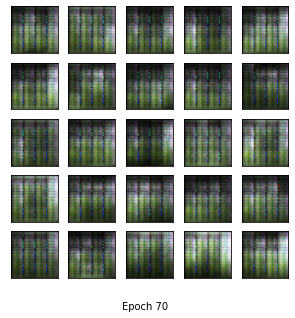

[71/100] - ptime: 1.73, loss_d: 0.624, loss_g: 0.895


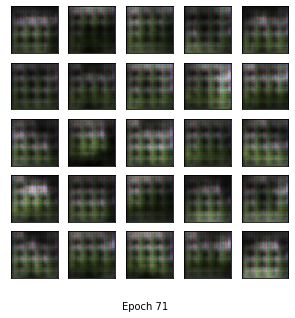

[72/100] - ptime: 1.23, loss_d: 0.585, loss_g: 0.654


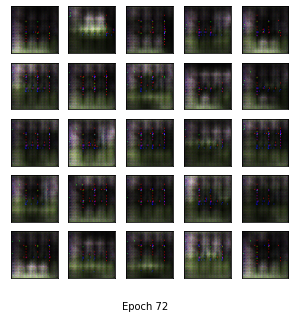

[73/100] - ptime: 1.28, loss_d: 0.560, loss_g: 0.752


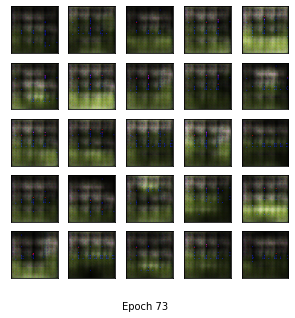

[74/100] - ptime: 1.34, loss_d: 0.623, loss_g: 0.721


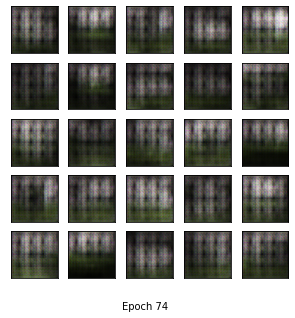

[75/100] - ptime: 1.19, loss_d: 0.622, loss_g: 0.746


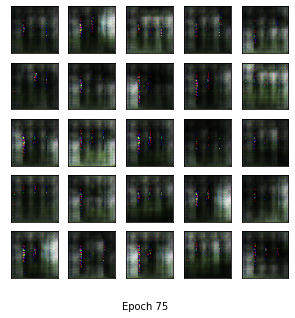

[76/100] - ptime: 1.29, loss_d: 0.603, loss_g: 0.665


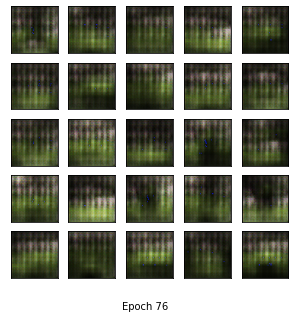

[77/100] - ptime: 1.23, loss_d: 0.633, loss_g: 0.821


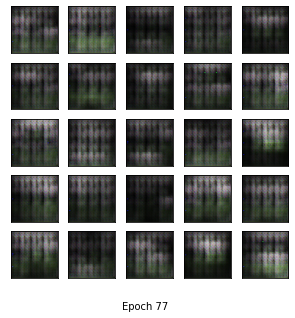

[78/100] - ptime: 1.35, loss_d: 0.573, loss_g: 0.710


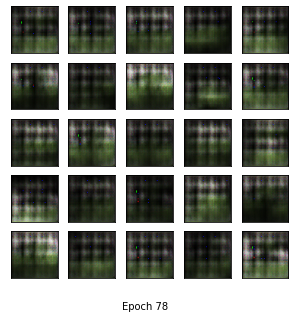

[79/100] - ptime: 1.23, loss_d: 0.572, loss_g: 0.735


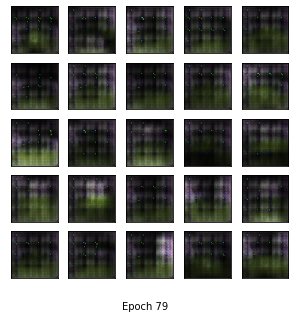

[80/100] - ptime: 1.66, loss_d: 0.574, loss_g: 0.722


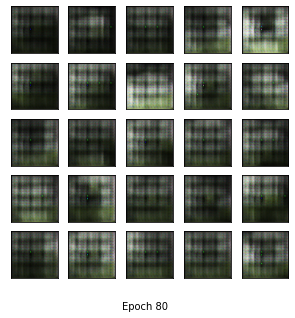

[81/100] - ptime: 1.31, loss_d: 0.565, loss_g: 0.735


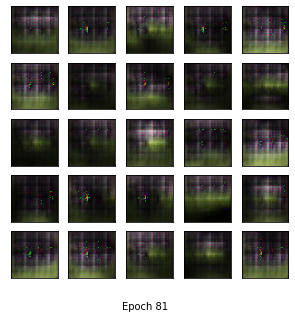

[82/100] - ptime: 1.26, loss_d: 0.574, loss_g: 0.743


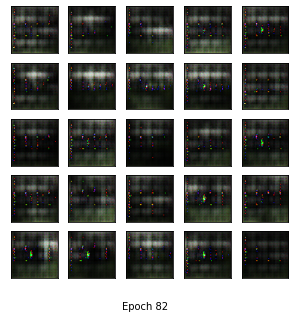

[83/100] - ptime: 1.30, loss_d: 0.571, loss_g: 0.728


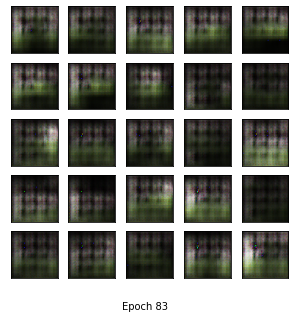

[84/100] - ptime: 1.18, loss_d: 0.590, loss_g: 0.687


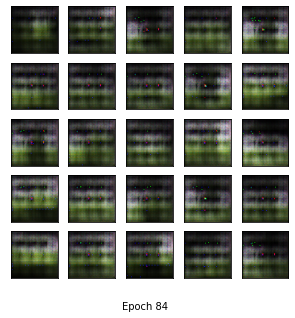

[85/100] - ptime: 1.23, loss_d: 0.548, loss_g: 0.744


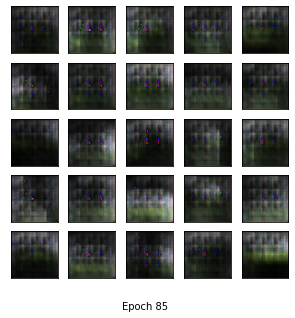

[86/100] - ptime: 1.30, loss_d: 0.560, loss_g: 0.664


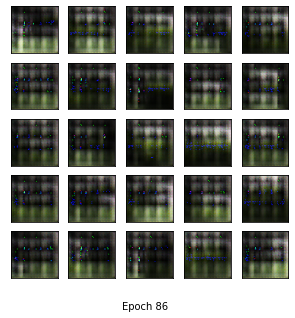

[87/100] - ptime: 1.22, loss_d: 0.623, loss_g: 0.808


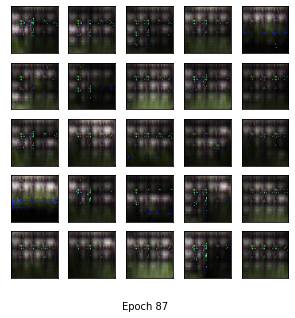

[88/100] - ptime: 1.22, loss_d: 0.679, loss_g: 0.678


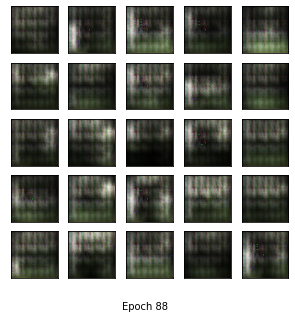

[89/100] - ptime: 1.79, loss_d: 0.575, loss_g: 0.773


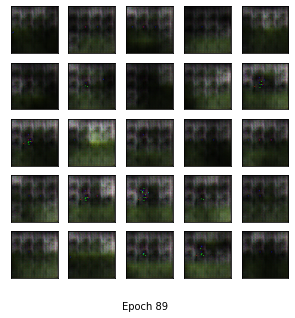

[90/100] - ptime: 1.26, loss_d: 0.632, loss_g: 0.627


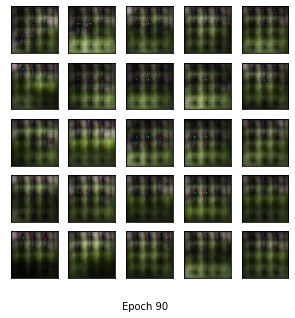

[91/100] - ptime: 1.21, loss_d: 0.573, loss_g: 0.778


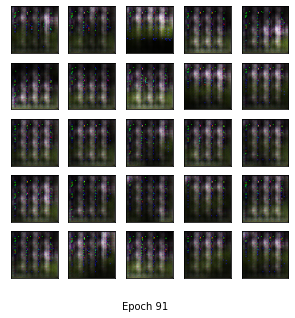

[92/100] - ptime: 1.22, loss_d: 0.598, loss_g: 0.725


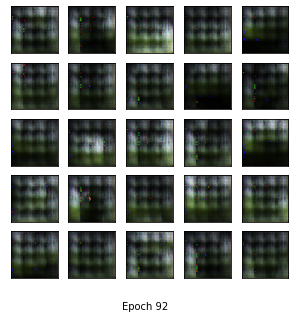

[93/100] - ptime: 1.33, loss_d: 0.594, loss_g: 0.767


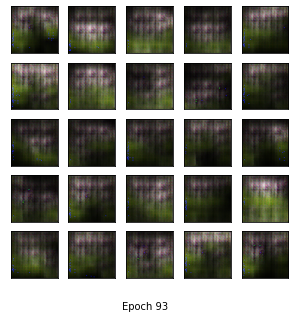

[94/100] - ptime: 1.22, loss_d: 0.620, loss_g: 0.738


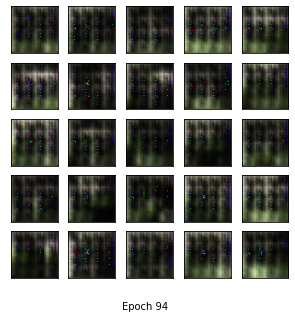

[95/100] - ptime: 1.24, loss_d: 0.527, loss_g: 0.785


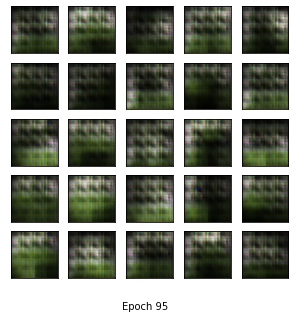

[96/100] - ptime: 1.31, loss_d: 0.619, loss_g: 0.763


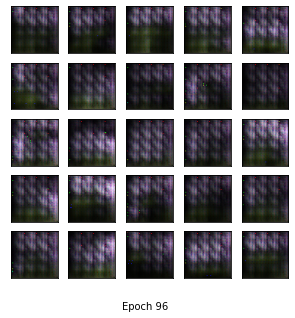

[97/100] - ptime: 1.23, loss_d: 0.583, loss_g: 0.764


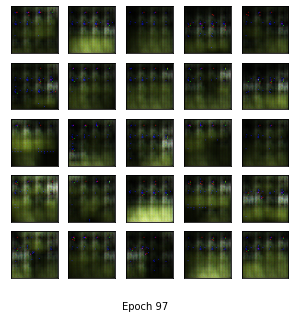

[98/100] - ptime: 1.66, loss_d: 0.487, loss_g: 0.773


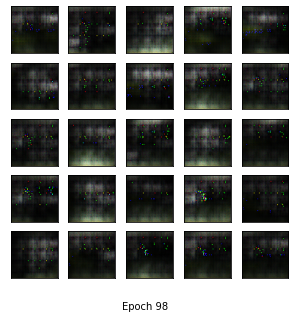

[99/100] - ptime: 1.27, loss_d: 0.587, loss_g: 0.650


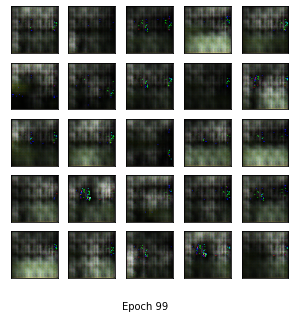

[100/100] - ptime: 1.26, loss_d: 0.590, loss_g: 0.706


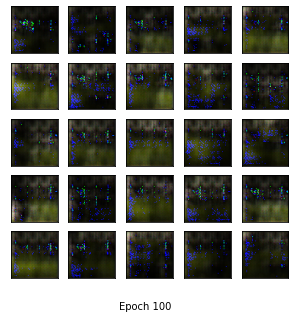

Avg per epoch ptime: 1.31, total 100 epochs ptime: 356.00
Training finish!... save training results


In [12]:
train_hist = {}
train_hist['D_losses'] = []
train_hist['G_losses'] = []
train_hist['per_epoch_ptimes'] = []
train_hist['total_ptime'] = []
num_iter = 0

print('training start!')
start_time = time.time()

for epoch in range(train_epoch):
    D_losses = []
    G_losses = [] 
    epoch_start_time = time.time()
    for x_, _ in train_loaders['train']:

        real = x_.to(device)
        noise = torch.randn(batch_size, 100, 1, 1).to(device)
        fake = gen(noise)
        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        disc_real = disc(real).reshape(-1)
        loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake = disc(fake.detach()).reshape(-1)
        loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        loss_disc = (loss_disc_real + loss_disc_fake) / 2
        disc.zero_grad()
        loss_disc.backward()
        opt_disc.step()

        D_losses.append(loss_disc.item())

        ### Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
        output = disc(fake).reshape(-1)
        loss_gen = criterion(output, torch.ones_like(output))
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        
        G_losses.append(loss_gen.item())

        num_iter += 1
    epoch_end_time = time.time()
    per_epoch_ptime = epoch_end_time - epoch_start_time

    print('[%d/%d] - ptime: %.2f, loss_d: %.3f, loss_g: %.3f' % ((epoch + 1), train_epoch, per_epoch_ptime, torch.mean(torch.FloatTensor(D_losses)),
                                                              torch.mean(torch.FloatTensor(G_losses))))
    p = 'DCGAN_results/Random_results/DCGAN_' + str(epoch + 1) + '.png'
    fixed_p = 'DCGAN_results/Fixed_results/DCGAN_' + str(epoch + 1) + '.png'
    show_result((epoch+1), show = True ,save=True, path=p, isFix=False)
    show_result((epoch+1), save=True, path=fixed_p, isFix=True)
    train_hist['D_losses'].append(torch.mean(torch.FloatTensor(D_losses)))
    train_hist['G_losses'].append(torch.mean(torch.FloatTensor(G_losses)))
    train_hist['per_epoch_ptimes'].append(per_epoch_ptime)

end_time = time.time()
total_ptime = end_time - start_time
train_hist['total_ptime'].append(total_ptime)

print("Avg per epoch ptime: %.2f, total %d epochs ptime: %.2f" % (torch.mean(torch.FloatTensor(train_hist['per_epoch_ptimes'])), train_epoch, total_ptime))
print("Training finish!... save training results")
torch.save(gen.state_dict(), "DCGAN_results/generator_param.pkl")
torch.save(disc.state_dict(), "DCGAN_results/discriminator_param.pkl")
with open('DCGAN_results/train_hist.pkl', 'wb') as f:
    pickle.dump(train_hist, f)

show_train_hist(train_hist, save=True, path='DCGAN_results/DCGAN_train_hist.png')

images = []
for e in range(train_epoch):
    img_name = 'DCGAN_results/Fixed_results/DCGAN_' + str(e + 1) + '.png'
    images.append(imageio.imread(img_name))
imageio.mimsave('DCGAN_results/generation_animation.gif', images, fps=5)